<a href="https://colab.research.google.com/github/vardhinisri/assignment/blob/main/project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error,accuracy_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = {
    'Activity': ['Walking', 'Jogging', 'Running', 'Cycling', 'Yoga', 'Gym'],
    'Duration (minutes)': [30, 30, 20, 30, 45, 60],
    'Calories Burnt': [130, 200, 300, 250, 120, 400]
}


In [ ]:
df = pd.DataFrame(data)


In [ ]:
print("Activities and Calories Burnt:")
print(df)


Activities and Calories Burnt:
  Activity  Duration (minutes)  Calories Burnt
0  Walking                  30             130
1  Jogging                  30             200
2  Running                  20             300
3  Cycling                  30             250
4     Yoga                  45             120
5      Gym                  60             400


<ipython-input-10-d5780da38829>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Activity', y='Calories Burnt', data=df, palette='viridis')


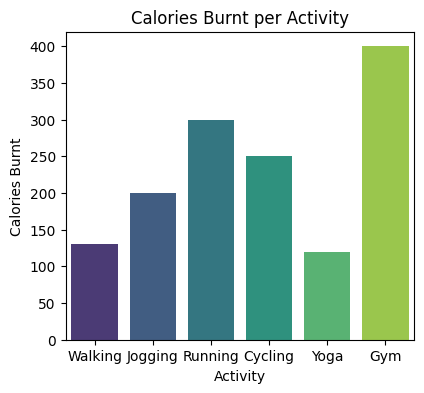

In [ ]:
plt.figure(figsize=(4.5, 4))
sns.barplot(x='Activity', y='Calories Burnt', data=df, palette='viridis')
plt.title('Calories Burnt per Activity')
plt.xlabel('Activity')
plt.ylabel('Calories Burnt')
plt.show()


In [ ]:
def health_suggestions(calories_burnt):
    if calories_burnt < 160:
        return "Increase activity intensity or duration."
    elif 160 <= calories_burnt <= 300:
        return "Good job! Maintain a balanced diet."
    else:
        return "Excellent! Stay hydrated and rest well."

df['Health Suggestion'] = df['Calories Burnt'].apply(health_suggestions)
print("\nHealth Suggestions Based on Activities:")




Health Suggestions Based on Activities:


In [ ]:
print(df)

  Activity  Duration (minutes)  Calories Burnt  \
0  Walking                  30             130   
1  Jogging                  30             200   
2  Running                  20             300   
3  Cycling                  30             250   
4     Yoga                  45             120   
5      Gym                  60             400   

                          Health Suggestion  
0  Increase activity intensity or duration.  
1       Good job! Maintain a balanced diet.  
2       Good job! Maintain a balanced diet.  
3       Good job! Maintain a balanced diet.  
4  Increase activity intensity or duration.  
5   Excellent! Stay hydrated and rest well.  


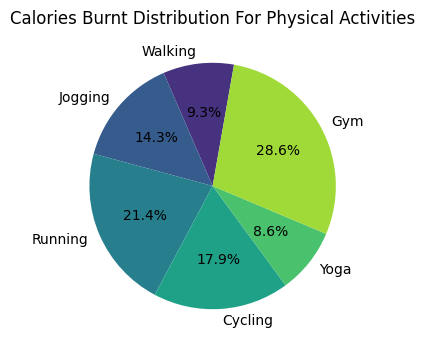

In [ ]:
plt.figure(figsize=(4.5, 4))
plt.pie(df['Calories Burnt'], labels=df['Activity'], autopct='%1.1f%%', startangle=80, colors=sns.color_palette('viridis', len(df)))
plt.title('Calories Burnt Distribution For Physical Activities')
plt.show()



In [ ]:
calories= pd.read_csv("/content/calories.csv")
calories.head()



,User_ID,Calories
0,14733363,231
1,14861698,66
2,11179863,26
3,16180408,71
4,17771927,35


In [ ]:
Activity_data = pd.read_csv("/content/Activity.csv")

In [ ]:
Activity_data.head()

,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp
0,14733363,male,68,190,94,29,105,40.8
1,14861698,female,20,166,60,14,94,40.3
2,11179863,male,69,179,79,5,88,38.7
3,16180408,female,34,179,71,13,100,40.5
4,17771927,female,27,154,58,10,81,39.8


In [ ]:
calories_data = pd.concat([Activity_data, calories['Calories']], axis=1)


In [ ]:
calories_data.head()

,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,14733363,male,68,190,94,29,105,40.8,231
1,14861698,female,20,166,60,14,94,40.3,66
2,11179863,male,69,179,79,5,88,38.7,26
3,16180408,female,34,179,71,13,100,40.5,71
4,17771927,female,27,154,58,10,81,39.8,35


In [ ]:
X = calories_data.drop('Calories', axis=1)  # Drop the target column to get features
y = calories_data['Calories']

In [ ]:
X = calories_data.drop(columns=['Calories'])
y = calories_data['Calories']

In [ ]:
X = pd.get_dummies(X, drop_first=True)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
y_train = y_train.values.reshape(-1, 1)
y_test = y_test.values.reshape(-1, 1)


ANN Model

In [ ]:
ann_model = Sequential([
    Dense(64, activation='relu', input_dim=X_train_scaled.shape[1]),
    Dense(32, activation='relu'),
    Dense(1)  # Output layer for regression
])
ann_model.compile(optimizer='adam', loss='mse', metrics=['mae'])
ann_history = ann_model.fit(X_train_scaled, y_train, validation_split=0.2, epochs=50, batch_size=16, verbose=1)

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


600/600 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 6349.1099 - mae: 55.8876 - val_loss: 111.0805 - val_mae: 8.2598
Epoch 2/50
600/600 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 95.2113 - mae: 7.6921 - val_loss: 61.3125 - val_mae: 6.1749
Epoch 3/50
600/600 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 52.4649 - mae: 5.6444 - val_loss: 28.2577 - val_mae: 4.0445
Epoch 4/50
600/600 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 23.4291 - mae: 3.6431 - val_loss: 13.1363 - val_mae: 2.6459
Epoch 5/50
600/600 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 11.1653 - mae: 2.4429 - val_loss: 8.2189 - val_mae: 2.0406
Epoch 6/50
600/600 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 6.9636 - mae: 1.8910 - val_loss: 5.3725 - val_mae: 1.6035
Epoch 7/50
600/600 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 4.9436 - mae: 1.5946 - val_loss: 4.0136 - val_mae: 1.3716
Epoch 8/50
600/600 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 3.4818 - mae: 1.3344 - val_loss: 3.4573 - val_mae: 1.3431
Epoch 9/50
600/600 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - 

In [ ]:
ann_predictions = ann_model.predict(X_test_scaled)

94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


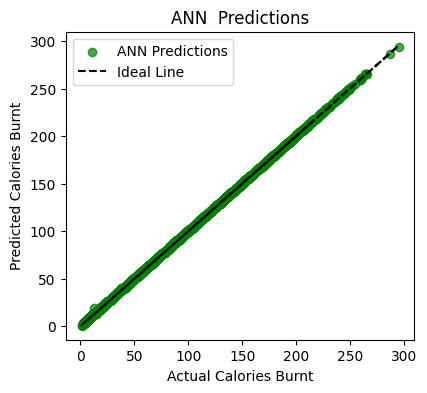

In [ ]:
plt.figure(figsize=(4.5, 4))
plt.scatter(y_test, ann_predictions, label='ANN Predictions', color='green', alpha=0.7)
plt.plot(y_test, y_test, color='black', linestyle='--', label='Ideal Line')
plt.title('ANN  Predictions')
plt.xlabel('Actual Calories Burnt')
plt.ylabel('Predicted Calories Burnt')
plt.legend()
plt.show()

In [ ]:

ann_mse = mean_squared_error(y_test, ann_predictions)
ann_rmse = np.sqrt(ann_mse)
ann_mae = mean_absolute_error(y_test, ann_predictions)
ann_r2 = r2_score(y_test, ann_predictions)


In [ ]:
ann_metrics = {
    "Metric": ["ann_mse", "ann_rmse",
               "ann_mae", "ann_r²"],
    "Value": [ann_mse, ann_rmse, ann_mae, ann_r2]
}
ann_metrics_df = pd.DataFrame(ann_metrics)

print("\nPerformance Metrics for ANN:")
print(ann_metrics_df.to_string(index=False))



Performance Metrics for ANN:
  Metric    Value
 ann_mse 0.207501
ann_rmse 0.455523
 ann_mae 0.357707
  ann_r² 0.999949


# Plotting metrics

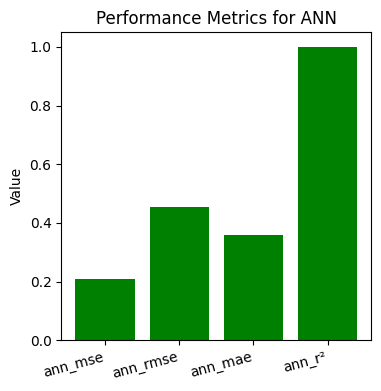

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(4, 4))
plt.bar(ann_metrics_df["Metric"], ann_metrics_df["Value"], color='green')
plt.title('Performance Metrics for ANN')
plt.ylabel('Value')
plt.xticks(rotation=15, ha='right')
plt.show()

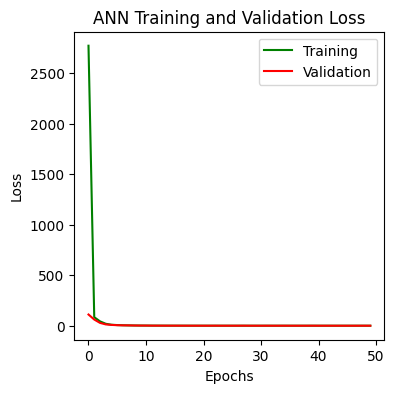

In [ ]:
plt.figure(figsize=(4, 4))
plt.plot(ann_history.history['loss'], label='Training', color='green')
plt.plot(ann_history.history['val_loss'], label='Validation', color='red')
plt.title('ANN Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, ann_predictions, label='ANN Predictions', color='green', alpha=0.7)
plt.plot(y_test, y_test, color='black', linestyle='--', label='Ideal Line')
plt.title('ANN  Predictions')
plt.xlabel('Actual Calories Burnt')
plt.ylabel('Predicted Calories Burnt')
plt.legend()
plt.show()


NameError: name 'ann_predictions' is not defined

<Figure size 1000x600 with 0 Axes>

In [ ]:
calories_data['Gender'] = calories_data['Gender'].map({'Male': 1, 'Female': 0})


In [ ]:
features_to_analyze = ['User_ID', 'Gender', 'Age', 'Height', 'Weight',
                        'Duration', 'Heart_Rate', 'Body_Temp', 'Calories']


In [ ]:
correlation_matrix = calories_data[features_to_analyze].corr()


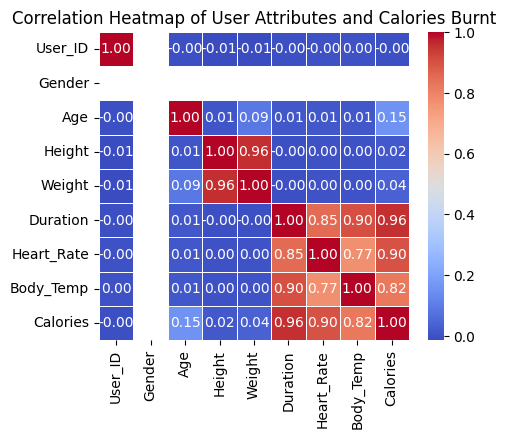

In [ ]:
plt.figure(figsize=(5,4))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of User Attributes and Calories Burnt')
plt.show()

In [ ]:
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)


In [ ]:
xgb_mse = mean_squared_error(y_test, xgb_predictions)
xgb_rmse = np.sqrt(xgb_mse)
xgb_mae = mean_absolute_error(y_test, xgb_predictions)
xgb_r2 = r2_score(y_test, xgb_predictions)


In [ ]:
print("Performance of XGBoost")
print(f"\nXGBoost RMSE: {xgb_rmse}")
print(f"XGBoost R² Score: {xgb_r2}")
print(f"\nXGBoost MSE: {xgb_mae}")
print(f"XGBoost MAE: {xgb_mse}")


Performance of XGBoost

XGBoost RMSE: 2.111057204121548
XGBoost R² Score: 0.9988957643508911

XGBoost MSE: 1.5032148361206055
XGBoost MAE: 4.456562519073486


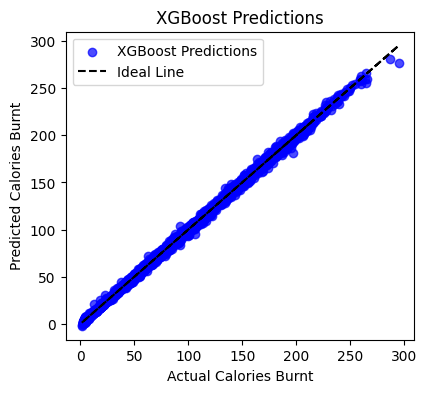

In [ ]:
plt.figure(figsize=(4.5, 4))
plt.scatter(y_test, xgb_predictions, label='XGBoost Predictions', color='blue', alpha=0.7)
plt.plot(y_test, y_test, color='black', linestyle='--', label='Ideal Line')
plt.title('XGBoost Predictions')
plt.xlabel('Actual Calories Burnt')
plt.ylabel('Predicted Calories Burnt')
plt.legend()
plt.show()



In [ ]:

xgb_residuals = y_test - xgb_predictions


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


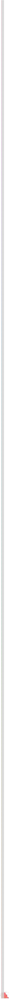

In [ ]:

sns.histplot(xgb_residuals, color='red', label='XGBoost Residuals', kde=True, bins=5)
plt.title('Residual Analysis XGBoost')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.legend()
plt.show()

